# Reconocimiento de Acciones con Red TSM





## Instrucciones Generales

El siguiente práctico se debe realizar de forma **individual**. El formato de entregar es el **archivo .ipynb con todas las celdas ejecutadas**. Todas las preguntas deben ser respondida en celdas de texto. No se aceptará el _output_ de una celda de código como respuesta.

**Nombre:** ROBERTO ARANEDA ESPINOZA

**Fecha de entrega: .**

El siguiente práctico cuanta con 1 secciones donde cada una contendrá 1 o más actividades a realizar. Algunas actividades correspondrán a escribir código y otras a responder preguntas.

El practico debe entregarse de forma **Individual** en caso contrario obtendrán la mínima calificación (1). Asimismo, debe indicar su nombre donde se indica sino la práctica no será calificada.

## Consejo : se debe ejecutar primero la descarga del dataset (paso 4)

---



## 1.0 Introduction

El objetivo del reconocimiento de actividades humanas es examinar actividades a partir de secuencias de video o imágenes fijas. Uno de los modelos más importantes en esta área está descrito en el documento. "[TSM: Temporal Shift Module for Efficient Video Understanding](https://arxiv.org/pdf/1811.08383.pdf)" by Ji Lin, Chuang Gan, Son Han. The paper was published as a ICCV 2019 conference paper.

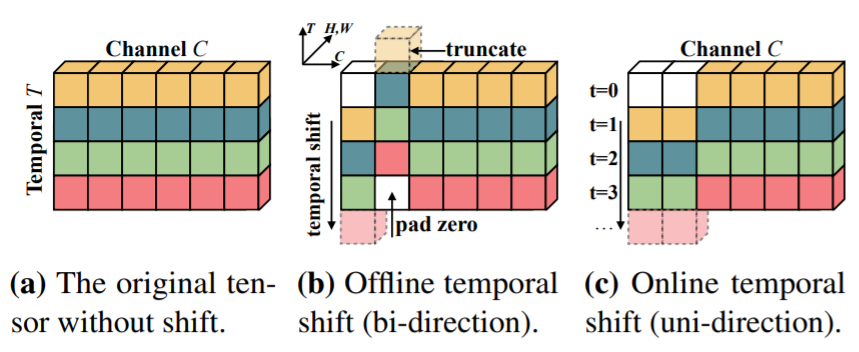


## 2.0 Setup

Este tutorial se basa en el repositorio oficial de TSM. Esta línea clona este repositorio.

In [4]:
! git clone https://github.com/mit-han-lab/temporal-shift-module.git

import os
os.chdir("/content/temporal-shift-module")

Cloning into 'temporal-shift-module'...
remote: Enumerating objects: 249, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 249 (delta 11), reused 17 (delta 9), pack-reused 226 (from 1)
Receiving objects: 100% (249/249), 253.17 KiB | 10.55 MiB/s, done.
Resolving deltas: 100% (114/114), done.


Necesitamos descargar los modelos pre-entrenados

In [5]:
!wget https://hanlab18.mit.edu/projects/tsm/models/TSM_kinetics_RGB_resnet50_shift8_blockres_avg_segment8_e100_dense.pth

--2026-08-16 14:26:27--  https://hanlab18.mit.edu/projects/tsm/models/TSM_kinetics_RGB_resnet50_shift8_blockres_avg_segment8_e100_dense.pth
Resolving hanlab18.mit.edu (hanlab18.mit.edu)... 18.25.16.171
Connecting to hanlab18.mit.edu (hanlab18.mit.edu)|18.25.16.171|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 97590233 (93M) [application/octet-stream]
Saving to: ‘TSM_kinetics_RGB_resnet50_shift8_blockres_avg_segment8_e100_dense.pth’

TSM_kinetics_RGB_re 100%[===================>]  93.07M  41.9MB/s    in 2.2s    

2026-08-16 14:26:30 (41.9 MB/s) - ‘TSM_kinetics_RGB_resnet50_shift8_blockres_avg_segment8_e100_dense.pth’ saved [97590233/97590233]



Inicializa las dependencias para este tutorial.

In [6]:
!pip install -q git+https://github.com/tensorflow/docs

  Preparing metadata (setup.py) ... done


In [7]:
import argparse
import time

import torch.nn.parallel
import torch.optim
from sklearn.metrics import confusion_matrix
from ops.dataset import TSNDataSet
from ops.models import TSN
from ops.transforms import *
from ops import dataset_config
from torch.nn import functional as F

import tempfile, ssl, re
from urllib import request  # requires python3
import subprocess
import cv2
import imageio
from tensorflow_docs.vis import embed
import glob

## 3.0 Intance the TSM Model

Configuración inicial para la Red TSM (proporcionada por los autores para los pesos específicos descargados).

In [8]:
args = {'weights':'/content/temporal-shift-module/TSM_kinetics_RGB_resnet50_shift8_blockres_avg_segment8_e100_dense.pth',
        'test_segments':8,
        'dense_sample':False,
        'twice_sample':False,
        'full_res':False,
        'test_crops':1,
        'coeff':None,
        'batch_size':1,
        'workers':8,
        'test_list':None,
        'csv_file':None,
        'softmax':True,
        'max_num':-1,
        'input_size':224,
        'crop_fusion_type':'avg',
        'gpus':None,
        'img_feature_dim': 256,
        'num_set_segments':1,
        'pretrain': 'imagenet'}

Esta función ayuda a determinar si el modelo pre-entrenado utiliza desplazamiento temporal o no utilizando el nombre del punto de control.

In [9]:
def parse_shift_option_from_log_name(log_name):
    if 'shift' in log_name:
        strings = log_name.split('_')
        for i, s in enumerate(strings):
            if 'shift' in s:
                break
        return True, int(strings[i].replace('shift', '')), strings[i + 1]
    else:
        return False, None, None

In [10]:
weights_list = args['weights'].split(',')
test_segments_list = [args['test_segments']]
assert len(weights_list) == len(test_segments_list)
if args['coeff'] is None:
    coeff_list = [1] * len(weights_list)
else:
    coeff_list = [float(c) for c in args['coeff'].split(',')]

if args['test_list'] is not None:
    test_file_list = args['test_list'].split(',')
else:
    test_file_list = [None] * len(weights_list)

En este caso, hay 400 clases porque el modelo fue entrenado con kinetics-400.

In [11]:
num_class = 400


Instancia el modelo TSM utilizando la configuración necesaria para los parámetros pre-entrenados.

In [12]:
data_iter_list = []
net_list = []
modality_list = []

total_num = None
for this_weights, this_test_segments, test_file in zip(weights_list, test_segments_list, test_file_list):
    is_shift, shift_div, shift_place = parse_shift_option_from_log_name(this_weights.split('/')[3])
    if 'RGB' in this_weights:
        modality = 'RGB'
    else:
        modality = 'Flow'
    this_arch = this_weights.split('TSM_')[1].split('_')[2]
    modality_list.append(modality)
    # num_class, args.train_list, val_list, root_path, prefix = dataset_config.return_dataset(args.dataset, modality)
    print('=> shift: {}, shift_div: {}, shift_place: {}'.format(is_shift, shift_div, shift_place))
    net = TSN(num_class, this_test_segments if is_shift else 1, modality,
              base_model=this_arch,
              consensus_type=args['crop_fusion_type'],
              img_feature_dim=args['img_feature_dim'],
              pretrain=args['pretrain'],
              is_shift=is_shift, shift_div=shift_div, shift_place=shift_place,
              non_local='_nl' in this_weights,
              )

=> shift: True, shift_div: 8, shift_place: blockres

    Initializing TSN with base model: resnet50.
    TSN Configurations:
        input_modality:     RGB
        num_segments:       8
        new_length:         1
        consensus_module:   avg
        dropout_ratio:      0.8
        img_feature_dim:    256
            
=> base model: resnet50


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 185MB/s]


Adding temporal shift...
=> n_segment per stage: [8, 8, 8, 8]
=> Processing stage with 3 blocks residual
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Processing stage with 4 blocks residual
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Processing stage with 6 blocks residual
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8
=> Processing stage with 3 blocks residual
=> Using fold div: 8
=> Using fold div: 8
=> Using fold div: 8


In [13]:
if 'tpool' in this_weights:
    from ops.temporal_shift import make_temporal_pool
    make_temporal_pool(net.base_model, this_test_segments)  # since DataParallel


Carga los parámetros pre-entrenados.

In [14]:
checkpoint = torch.load(this_weights)
checkpoint = checkpoint['state_dict']

# base_dict = {('base_model.' + k).replace('base_model.fc', 'new_fc'): v for k, v in list(checkpoint.items())}
base_dict = {'.'.join(k.split('.')[1:]): v for k, v in list(checkpoint.items())}
replace_dict = {'base_model.classifier.weight': 'new_fc.weight',
                'base_model.classifier.bias': 'new_fc.bias',
                }
for k, v in replace_dict.items():
    if k in base_dict:
        base_dict[v] = base_dict.pop(k)

net.load_state_dict(base_dict)

<All keys matched successfully>

## 4.0 Download video dataset


Las siguientes funciones permiten obtener videos del conjunto de datos UCF101 desde el repositorio original:

* **list_ucf_videos** devuelve la lista de videos.
* **fetch_ucf_video** devuelve un video seleccionado, necesitas proporcionar el nombre del video.

In [1]:
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF101/UCF101.rar

--2026-08-16 13:57:46--  https://www.crcv.ucf.edu/data/UCF101/UCF101.rar
Resolving www.crcv.ucf.edu (www.crcv.ucf.edu)... 132.170.214.127
Connecting to www.crcv.ucf.edu (www.crcv.ucf.edu)|132.170.214.127|:443... connected.
  Unable to locally verify the issuer's authority.
HTTP request sent, awaiting response... 200 OK
Length: 6932971618 (6.5G) [application/x-rar-compressed]
Saving to: ‘UCF101.rar’

UCF101.rar          100%[===================>]   6.46G  24.7MB/s    in 2m 49s  

2026-08-16 14:00:35 (39.2 MB/s) - ‘UCF101.rar’ saved [6932971618/6932971618]



In [2]:
!unrar x '/content/UCF101.rar'

Se han truncado las últimas 5000 líneas del flujo de salida.
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c05.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c06.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g06_c07.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c01.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c02.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c03.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c04.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c05.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c06.avi             62%  OK 
Extracting  UCF-101/PlayingGuitar/v_PlayingGuitar_g07_c07.avi             62%  OK 
Extracting  UCF-101

In [15]:
# Utilities to fetch videos from UCF101 dataset
UCF_ROOT = '/content/UCF-101'
_VIDEO_LIST = None
_CACHE_DIR = '/content/data/'
# As of July 2020, crcv.ucf.edu doesn't use a certificate accepted by the
# default Colab environment anymore.
unverified_context = ssl._create_unverified_context()

def fetch_ucf_video(video):
  """Fetchs a video and cache into local filesystem."""
  cache_path = os.path.join(_CACHE_DIR, video)
  if not os.path.exists(cache_path):
    urlpath = request.urljoin(UCF_ROOT, video)
    print("Fetching %s => %s" % (urlpath, cache_path))
    data = request.urlopen(urlpath, context=unverified_context).read()
    open(cache_path, "wb").write(data)
  return cache_path

In [16]:
import os
import re
from collections import defaultdict

def list_ucf_videos(video_dir):
    """
    Lists AVI videos available in the UCF101 dataset from a specified local directory,
    including all subdirectories, and groups them by category.

    Args:
        video_dir (str): Path to the directory containing the UCF101 video files.

    Returns:
        dict: Dictionary with categories as keys and a list of video filenames as values.
        list: List of all video filenames found in all categories.
    """
    if not os.path.exists(video_dir):
        raise ValueError(f"Provided directory does not exist: {video_dir}")
    if not os.path.isdir(video_dir):
        raise ValueError(f"Provided path is not a directory: {video_dir}")

    category_videos = defaultdict(list)
    all_videos = []  # Initialize an empty list to store all video filenames
    # Walk through all subdirectories
    for root, dirs, files in os.walk(video_dir):
        category_name = os.path.basename(root)  # Get the name of the directory
        for filename in files:
            # Check if the file is an AVI video
            if re.match(r"^v_.*\.avi$", filename):
                category_videos[category_name].append(filename)
                all_videos.append(filename)  # Add filename to all_videos list

    # Sort and format the output
    for category in sorted(category_videos):
        videos = category_videos[category]
        videos.sort()
        num_videos = len(videos)
        sample_videos = ', '.join(videos[:min(3, num_videos)]) + ', ...' if num_videos > 3 else ', '.join(videos)
        print(f"{category:<20} {num_videos} videos ({sample_videos})")

    return category_videos, all_videos  # Return both the dictionary and the list of all videos



La función **to_gif** convierte un video a un archivo GIF

In [17]:
# Utilities to open video files using CV2
def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]

def load_video(path, max_frames=0, resize=(224, 224)):
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)

      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

def to_gif(path):
  images = load_video(path)
  name = path.split('/')[-1:][0].split('.')[0]
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('/content/{}.gif'.format(name), converted_images, fps=25)
  return embed.embed_file('/content/{}.gif'.format(name))

In [18]:
# Get the list of videos in the dataset.
ucf_videos = list_ucf_videos(UCF_ROOT)


ApplyEyeMakeup       145 videos (v_ApplyEyeMakeup_g01_c01.avi, v_ApplyEyeMakeup_g01_c02.avi, v_ApplyEyeMakeup_g01_c03.avi, ...)
ApplyLipstick        114 videos (v_ApplyLipstick_g01_c01.avi, v_ApplyLipstick_g01_c02.avi, v_ApplyLipstick_g01_c03.avi, ...)
Archery              145 videos (v_Archery_g01_c01.avi, v_Archery_g01_c02.avi, v_Archery_g01_c03.avi, ...)
BabyCrawling         132 videos (v_BabyCrawling_g01_c01.avi, v_BabyCrawling_g01_c02.avi, v_BabyCrawling_g01_c03.avi, ...)
BalanceBeam          108 videos (v_BalanceBeam_g01_c01.avi, v_BalanceBeam_g01_c02.avi, v_BalanceBeam_g01_c03.avi, ...)
BandMarching         155 videos (v_BandMarching_g01_c01.avi, v_BandMarching_g01_c02.avi, v_BandMarching_g01_c03.avi, ...)
BaseballPitch        150 videos (v_BaseballPitch_g01_c01.avi, v_BaseballPitch_g01_c02.avi, v_BaseballPitch_g01_c03.avi, ...)
Basketball           134 videos (v_Basketball_g01_c01.avi, v_Basketball_g01_c02.avi, v_Basketball_g01_c03.avi, ...)
BasketballDunk       131 videos (v_B


Crear las carpetas de datos.

In [19]:
os.mkdir('/content/data/')
os.mkdir('/content/data/videos/')

Descargar un video

In [20]:
video_path = fetch_ucf_video("/content/UCF-101/HighJump/v_HighJump_g01_c02.avi")

## 5.0 Preparar los datos

Transformación de video para la red.

In [21]:
input_size = net.scale_size if args['full_res'] else net.input_size
if args['test_crops'] == 1:
    cropping = torchvision.transforms.Compose([
        GroupScale(net.scale_size),
        GroupCenterCrop(input_size),
    ])
elif args['test_crops'] == 3:  # do not flip, so only 5 crops
    cropping = torchvision.transforms.Compose([
        GroupFullResSample(input_size, net.scale_size, flip=False)
    ])
elif args['test_crops'] == 5:  # do not flip, so only 5 crops
    cropping = torchvision.transforms.Compose([
        GroupOverSample(input_size, net.scale_size, flip=False)
    ])
elif args['test_crops'] == 10:
    cropping = torchvision.transforms.Compose([
        GroupOverSample(input_size, net.scale_size)
    ])
else:
    raise ValueError("Only 1, 5, 10 crops are supported while we got {}".format(args.test_crops))

Función para preprocesar los videos.

In [22]:
def vid2jpg(file_name, video_file_path, dst_class_path):

    name, ext = os.path.splitext(file_name)
    dst_directory_path = os.path.join(dst_class_path, name)

    try:
        if os.path.exists(dst_directory_path):
            if not os.path.exists(os.path.join(dst_directory_path, 'img_00001.jpg')):
                subprocess.call('rm -r \"{}\"'.format(dst_directory_path), shell=True)
                print('remove {}'.format(dst_directory_path))
                os.mkdir(dst_directory_path)
            else:
                print('*** convert has been done: {}'.format(dst_directory_path))
                return
        else:
            os.mkdir(dst_directory_path)
    except:
        print(dst_directory_path)
        return
    cmd = 'ffmpeg -i \"{}\" -threads 1 -vf scale=-1:331 -q:v 0 \"{}/img_%05d.jpg\"'.format(video_file_path, dst_directory_path)
    # print(cmd)
    subprocess.call(cmd, shell=True,
                    stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

In [23]:
vid2jpg('v_HighJump_g01_c02.avi', '/content/UCF-101/HighJump/v_HighJump_g01_c02.avi', '/content/data/videos/')

## 6.0 Dataset

Esta es la clase de conjunto de datos que es esencial para llevar los videos al modelo.



In [24]:
# Code for "TSM: Temporal Shift Module for Efficient Video Understanding"
# arXiv:1811.08383
# Ji Lin*, Chuang Gan, Song Han
# {jilin, songhan}@mit.edu, ganchuang@csail.mit.edu

import torch.utils.data as data

from PIL import Image
import os
import numpy as np
from numpy.random import randint


class VideoRecord(object):
    def __init__(self, row):
        self._data = row

    @property
    def path(self):
        return self._data[0]

    @property
    def num_frames(self):
        return int(self._data[1])

    @property
    def label(self):
        return int(self._data[2])


class TSNDataSet(data.Dataset):
    def __init__(self, root_path,
                 num_segments=3, new_length=1, modality='RGB',
                 image_tmpl='img_{:05d}.jpg', transform=None,
                 random_shift=True, test_mode=False,
                 remove_missing=False, dense_sample=False, twice_sample=False):

        self.root_path = root_path
        self.num_segments = num_segments
        self.new_length = new_length
        self.modality = modality
        self.image_tmpl = image_tmpl
        self.transform = transform
        self.random_shift = random_shift
        self.test_mode = test_mode
        self.remove_missing = remove_missing
        self.dense_sample = dense_sample  # using dense sample as I3D
        self.twice_sample = twice_sample  # twice sample for more validation
        if self.dense_sample:
            print('=> Using dense sample for the dataset...')
        if self.twice_sample:
            print('=> Using twice sample for the dataset...')

        if self.modality == 'RGBDiff':
            self.new_length += 1  # Diff needs one more image to calculate diff

        self._parse_list()

    def _load_image(self, directory, idx):
        if self.modality == 'RGB' or self.modality == 'RGBDiff':
            try:
                return [Image.open(os.path.join(self.root_path, directory, self.image_tmpl.format(idx))).convert('RGB')]
            except Exception:
                print('error loading image:', os.path.join(self.root_path, directory, self.image_tmpl.format(idx)))
                return [Image.open(os.path.join(self.root_path, directory, self.image_tmpl.format(1))).convert('RGB')]
        elif self.modality == 'Flow':
            if self.image_tmpl == 'flow_{}_{:05d}.jpg':  # ucf
                x_img = Image.open(os.path.join(self.root_path, directory, self.image_tmpl.format('x', idx))).convert(
                    'L')
                y_img = Image.open(os.path.join(self.root_path, directory, self.image_tmpl.format('y', idx))).convert(
                    'L')
            elif self.image_tmpl == '{:06d}-{}_{:05d}.jpg':  # something v1 flow
                x_img = Image.open(os.path.join(self.root_path, '{:06d}'.format(int(directory)), self.image_tmpl.
                                                format(int(directory), 'x', idx))).convert('L')
                y_img = Image.open(os.path.join(self.root_path, '{:06d}'.format(int(directory)), self.image_tmpl.
                                                format(int(directory), 'y', idx))).convert('L')
            else:
                try:
                    # idx_skip = 1 + (idx-1)*5
                    flow = Image.open(os.path.join(self.root_path, directory, self.image_tmpl.format(idx))).convert(
                        'RGB')
                except Exception:
                    print('error loading flow file:',
                          os.path.join(self.root_path, directory, self.image_tmpl.format(idx)))
                    flow = Image.open(os.path.join(self.root_path, directory, self.image_tmpl.format(1))).convert('RGB')
                # the input flow file is RGB image with (flow_x, flow_y, blank) for each channel
                flow_x, flow_y, _ = flow.split()
                x_img = flow_x.convert('L')
                y_img = flow_y.convert('L')

            return [x_img, y_img]

    def _parse_list(self):
        # check the frame number is large >3:
        tmp = os.listdir(self.root_path)
        # if not self.test_mode or self.remove_missing:
        #     tmp = [item for item in tmp if int(item[1]) >= 3]
        path_frames = []
        num_frames = []
        for item in tmp:
            path_frame = os.path.join(self.root_path, item)
            path_frames.append(path_frame)
            num_frames.append(len(os.listdir(path_frame)))

        self.video_list = [VideoRecord([path_frames[i],num_frames[i]]) for i in range(len(tmp))]
        if self.image_tmpl == '{:06d}-{}_{:05d}.jpg':
            for v in self.video_list:
                v._data[1] = int(v._data[1]) / 2
        print('video number:%d' % (len(self.video_list)))

    def _sample_indices(self, record):
        """

        :param record: VideoRecord
        :return: list
        """
        if self.dense_sample:  # i3d dense sample
            sample_pos = max(1, 1 + record.num_frames - 64)
            t_stride = 64 // self.num_segments
            start_idx = 0 if sample_pos == 1 else np.random.randint(0, sample_pos - 1)
            offsets = [(idx * t_stride + start_idx) % record.num_frames for idx in range(self.num_segments)]
            return np.array(offsets) + 1
        else:  # normal sample
            average_duration = (record.num_frames - self.new_length + 1) // self.num_segments
            if average_duration > 0:
                offsets = np.multiply(list(range(self.num_segments)), average_duration) + randint(average_duration,
                                                                                                  size=self.num_segments)
            elif record.num_frames > self.num_segments:
                offsets = np.sort(randint(record.num_frames - self.new_length + 1, size=self.num_segments))
            else:
                offsets = np.zeros((self.num_segments,))
            return offsets + 1

    def _get_val_indices(self, record):
        if self.dense_sample:  # i3d dense sample
            sample_pos = max(1, 1 + record.num_frames - 64)
            t_stride = 64 // self.num_segments
            start_idx = 0 if sample_pos == 1 else np.random.randint(0, sample_pos - 1)
            offsets = [(idx * t_stride + start_idx) % record.num_frames for idx in range(self.num_segments)]
            return np.array(offsets) + 1
        else:
            if record.num_frames > self.num_segments + self.new_length - 1:
                tick = (record.num_frames - self.new_length + 1) / float(self.num_segments)
                offsets = np.array([int(tick / 2.0 + tick * x) for x in range(self.num_segments)])
            else:
                offsets = np.zeros((self.num_segments,))
            return offsets + 1

    def _get_test_indices(self, record):
        if self.dense_sample:
            sample_pos = max(1, 1 + record.num_frames - 64)
            t_stride = 64 // self.num_segments
            start_list = np.linspace(0, sample_pos - 1, num=10, dtype=int)
            offsets = []
            for start_idx in start_list.tolist():
                offsets += [(idx * t_stride + start_idx) % record.num_frames for idx in range(self.num_segments)]
            return np.array(offsets) + 1
        elif self.twice_sample:
            tick = (record.num_frames - self.new_length + 1) / float(self.num_segments)

            offsets = np.array([int(tick / 2.0 + tick * x) for x in range(self.num_segments)] +
                               [int(tick * x) for x in range(self.num_segments)])

            return offsets + 1
        else:
            tick = (record.num_frames - self.new_length + 1) / float(self.num_segments)
            offsets = np.array([int(tick / 2.0 + tick * x) for x in range(self.num_segments)])
            return offsets + 1

    def __getitem__(self, index):
        record = self.video_list[index]
        # check this is a legit video folder
        if self.image_tmpl == 'flow_{}_{:05d}.jpg':
            file_name = self.image_tmpl.format('x', 1)
            full_path = os.path.join(record.path, file_name)
        elif self.image_tmpl == '{:06d}-{}_{:05d}.jpg':
            file_name = self.image_tmpl.format(int(record.path), 'x', 1)
            full_path = os.path.join('{:06d}'.format(int(record.path)), file_name)
        else:
            file_name = self.image_tmpl.format(1)
            full_path = os.path.join(record.path, file_name)

        while not os.path.exists(full_path):
            print('################## Not Found:', os.path.join(record.path, file_name))
            index = np.random.randint(len(self.video_list))
            record = self.video_list[index]
            if self.image_tmpl == 'flow_{}_{:05d}.jpg':
                file_name = self.image_tmpl.format('x', 1)
                full_path = os.path.join(self.root_path, record.path, file_name)
            elif self.image_tmpl == '{:06d}-{}_{:05d}.jpg':
                file_name = self.image_tmpl.format(int(record.path), 'x', 1)
                full_path = os.path.join(self.root_path, '{:06d}'.format(int(record.path)), file_name)
            else:
                file_name = self.image_tmpl.format(1)
                full_path = os.path.join(self.root_path, record.path, file_name)

        if not self.test_mode:
            segment_indices = self._sample_indices(record) if self.random_shift else self._get_val_indices(record)
        else:
            segment_indices = self._get_test_indices(record)
        return self.get(record, segment_indices)

    def get(self, record, indices):

        images = list()
        to_image = []
        for seg_ind in indices:
            p = int(seg_ind)
            for i in range(self.new_length):
                seg_imgs = self._load_image(record.path, p)
                images.extend(seg_imgs)
                if p < record.num_frames:
                    p += 1

        process_data = self.transform(images)
        return process_data
    def __len__(self):
        return len(self.video_list)


Instanciamos el conjunto de datos y el cargador de datos.

In [25]:
dataset_test = TSNDataSet('/content/data/videos', num_segments=this_test_segments,
                       new_length=1 if modality == "RGB" else 5,
                       modality=modality,
                       image_tmpl='img_{:05d}.jpg',
                       test_mode=True,
                       remove_missing=len(weights_list) == 1,
                       transform=torchvision.transforms.Compose([
                           cropping,
                           Stack(roll=(this_arch in ['BNInception', 'InceptionV3'])),
                           ToTorchFormatTensor(div=(this_arch not in ['BNInception', 'InceptionV3'])),
                           GroupNormalize(net.input_mean, net.input_std),
                       ]), dense_sample=args['dense_sample'], twice_sample=args['twice_sample'])

data_loader = torch.utils.data.DataLoader(dataset_test, batch_size=args['batch_size'], shuffle=False, pin_memory=True)

video number:1


In [26]:
os.listdir('/content/data/videos')

['v_HighJump_g01_c02']

## 7.0 Realiza una inferencia con el modelo.



Configuramos el dispositivo (GPU si está disponible o CPU en otros casos).

In [27]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

Pon el modelo en modo de evaluación

In [28]:
net.eval()

Realiza las predicciones.

In [29]:
with torch.no_grad():
    outputs = []
    for data in data_loader:
        batch_size = args['batch_size']
        num_crop = args['test_crops']
        if args['dense_sample']:
            num_crop *= 10  # 10 clips for testing when using dense sample

        if args['twice_sample']:
            num_crop *= 2

        if modality == 'RGB':
            length = 3
        elif modality == 'Flow':
            length = 10
        elif modality == 'RGBDiff':
            length = 18
        else:
            raise ValueError("Unknown modality "+ modality)

        data_in = data.view(-1, length, data.size(2), data.size(3))
        if is_shift:
            data_in = data_in.view(batch_size * num_crop, this_test_segments, length, data_in.size(2), data_in.size(3))
        rst = net(data_in)
        rst = rst.reshape(batch_size, num_crop, -1).mean(1)

        if args['softmax']:
            # take the softmax to normalize the output to probability
            rst = F.softmax(rst, dim=1)

        rst = rst.data.cpu().numpy().copy()

        if net.is_shift:
            rst = rst.reshape(batch_size, num_class)
        else:
            rst = rst.reshape((batch_size, -1, num_class)).mean(axis=1).reshape((batch_size, num_class))

        outputs.append(rst)

## 8.0 Muestra las predicciones

In [30]:
def to_gif(path, max_frames=0, resize=(224, 224)):
    try:
        images = load_video(path, max_frames, resize)
        if images.size == 0:
            raise ValueError("No se cargaron imágenes desde el video.")

        name = os.path.basename(path).split('.')[0]
        gif_path = f'/content/{name}.gif'
        # Multiplicamos por 255 y convertimos a uint8 para guardarlo como GIF.
        converted_images = (images * 255).astype(np.uint8)
        imageio.mimsave(gif_path, converted_images, fps=25)

        # Suponiendo que embed es una función disponible para incrustar archivos.
        return embed.embed_file(gif_path)
    except Exception as e:
        print(f"Error al crear el GIF: {e}")
        return None

In [31]:
KINETICS_URL = "https://raw.githubusercontent.com/deepmind/kinetics-i3d/master/data/label_map.txt"
with request.urlopen(KINETICS_URL) as obj:
  labels = [line.decode("utf-8").strip() for line in obj.readlines()]
print("Found %d labels." % len(labels))

Found 400 labels.


In [32]:
# Asegurate que aviFilenameList tenga la carpeta correspondiente a la categoria del video
aviFilenamesList = glob.glob('/content/UCF-101/HighJump/*.avi')

In [33]:
index = 0


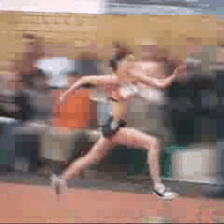

In [34]:
to_gif(aviFilenamesList[index])

In [35]:
print("Top 5 actions:")
k=5
probabilities = outputs[index].reshape(outputs[index].shape[1])
for i in np.argsort(probabilities)[::-1][:k]:
    print(f"  {labels[i]:22}: {probabilities[i] * 100:5.2f}%")

Top 5 actions:
  high jump             : 99.12%
  hurdling              :  0.86%
  pole vault            :  0.01%
  dunking basketball    :  0.00%
  long jump             :  0.00%


## 9.0 Preguntas

Ahora es tu turno. Reutiliza el código de las secciones 3, 4, 5, 6 y 7 para descargar y predecir la acción del siguiente video: **v_PlayingGuitar_g01_c01.avi**

frames extraídos: 250
video number:2
orden real del data_loader: {'v_HighJump_g01_c02': 0, 'v_PlayingGuitar_g01_c01': 1}
2 videos inferidos en 2.1 s

Top 5 — v_PlayingGuitar_g01_c01   (outputs[1])
  playing guitar          :  40.66%
  busking                 :  24.04%
  playing clarinet        :  13.03%
  strumming guitar        :   6.74%
  singing                 :   3.17%

Top 5 — v_HighJump_g01_c02   (outputs[0])
  high jump               :  99.12%
  hurdling                :   0.86%
  pole vault              :   0.01%
  dunking basketball      :   0.00%
  long jump               :   0.00%



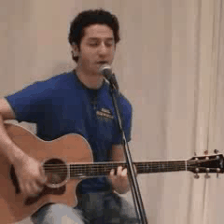

In [36]:
## Write the code here ...
# ==============================================================
# ACTIVIDAD — predecir la acción de v_PlayingGuitar_g01_c01.avi
# ==============================================================
import os, glob, time
import numpy as np, torch
from torch.nn import functional as F

VIDEO     = 'v_PlayingGuitar_g01_c01.avi'
CATEGORIA = 'PlayingGuitar'
SRC       = f'/content/UCF-101/{CATEGORIA}/{VIDEO}'
assert os.path.exists(SRC), f'no existe {SRC}'

# ---- [1] Sección 5: video -> JPEGs ---------------------------
os.makedirs('/content/data/videos/', exist_ok=True)
vid2jpg(VIDEO, SRC, '/content/data/videos/')

dst = '/content/data/videos/' + VIDEO[:-4]
n_frames = len(glob.glob(dst + '/img_*.jpg'))
print(f'frames extraídos: {n_frames}')
assert n_frames > 0, 'ffmpeg no extrajo nada'

# ---- [2] Sección 6: dataset + loader -------------------------
dataset_test = TSNDataSet('/content/data/videos',
                          num_segments=this_test_segments,
                          new_length=1 if modality == "RGB" else 5,
                          modality=modality,
                          image_tmpl='img_{:05d}.jpg',
                          test_mode=True,
                          remove_missing=len(weights_list) == 1,
                          transform=torchvision.transforms.Compose([
                              cropping,
                              Stack(roll=(this_arch in ['BNInception', 'InceptionV3'])),
                              ToTorchFormatTensor(div=(this_arch not in ['BNInception', 'InceptionV3'])),
                              GroupNormalize(net.input_mean, net.input_std),
                          ]),
                          dense_sample=args['dense_sample'],
                          twice_sample=args['twice_sample'])

data_loader = torch.utils.data.DataLoader(dataset_test, batch_size=args['batch_size'],
                                          shuffle=False, pin_memory=True)

# ---- [3] mapa nombre -> índice -------------------------------
idx_de = {os.path.basename(r.path): i for i, r in enumerate(dataset_test.video_list)}
print('orden real del data_loader:', idx_de)

# ---- [4] Sección 7: inferencia -------------------------------
net.eval()
t0 = time.time()
with torch.no_grad():
    outputs = []
    for data in data_loader:
        length = 3                                  # RGB
        data_in = data.view(-1, length, data.size(2), data.size(3))
        if is_shift:
            data_in = data_in.view(args['batch_size'] * args['test_crops'],
                                   this_test_segments, length,
                                   data_in.size(2), data_in.size(3))
        rst = net(data_in)
        rst = rst.reshape(args['batch_size'], args['test_crops'], -1).mean(1)
        rst = F.softmax(rst, dim=1)
        outputs.append(rst.cpu().numpy().copy().reshape(args['batch_size'], num_class))
print(f'{len(outputs)} videos inferidos en {time.time()-t0:.1f} s')

# ---- [5] Sección 8: top-5 por nombre -------------------------
def top_k(nombre, k=5):
    i = idx_de[nombre]
    p = outputs[i].reshape(-1)
    print(f'\nTop {k} — {nombre}   (outputs[{i}])')
    for j in np.argsort(p)[::-1][:k]:
        print(f'  {labels[j]:24}: {p[j]*100:6.2f}%')

top_k(VIDEO[:-4])
top_k('v_HighJump_g01_c02')

to_gif(SRC)


**Resultado de la actividad**

Se extrajeron 250 frames de `v_PlayingGuitar_g01_c01.avi` con ffmpeg, se reconstruyó el
`TSNDataSet` sobre `/content/data/videos` (que ahora contiene 2 videos) y se ejecutó la
inferencia con el mismo modelo TSM ResNet-50 pre-entrenado en Kinetics-400.

Top-5 obtenido:

| Clase Kinetics-400 | Probabilidad |
|---|---|
| playing guitar | 40,66 % |
| busking | 24,04 % |
| playing clarinet | 13,03 % |
| strumming guitar | 6,74 % |
| singing | 3,17 % |

**La predicción es correcta**: `playing guitar` ocupa el primer lugar. Sin embargo, la
confianza (40,66 %) es muy inferior a la del video de referencia `v_HighJump_g01_c02`
(`high jump`, 99,12 %), pese a tratarse del mismo modelo y el mismo protocolo de
evaluación. Tres factores explican la diferencia:

1. **Fragmentación del vocabulario.** Kinetics-400 contiene cinco etiquetas de guitarra
   (`playing guitar`, `strumming guitar`, `tapping guitar`, `playing bass guitar`,
   `playing ukulele`). La probabilidad se reparte entre sinónimos: sumando
   `playing guitar` y `strumming guitar` se alcanza 47,4 %. `high jump`, en cambio, es
   una clase única sin competidores semánticos en el vocabulario.

2. **Clases de contexto.** `busking` (tocar en la vía pública) y `singing` no describen
   el instrumento ni la acción manual, sino la situación. Suman 27,2 %, lo que indica
   que el modelo integra la escena completa y no solo al ejecutante.

3. **Confusión por postura.** `playing clarinet` (13,03 %) revela que la representación
   se apoya en la pose corporal —persona sentada, brazos flexionados, manos frente al
   torso— más que en la identificación fina del instrumento, que tras el escalado a
   224×224 y el recorte central ocupa pocos píxeles.

**Observación sobre el muestreo temporal.** El video de guitarra tiene 250 frames y el
muestreo por segmentos toma uno cada ~31 frames (1,25 s). A esa escala la acción es
cuasi-estática y los 8 frames son casi redundantes entre sí, por lo que el
desplazamiento temporal del TSM aporta poca información adicional. En `high jump`, los
8 frames cubren carrera, despegue, vuelo y caída: una progresión temporal inequívoca
que el módulo sí puede explotar. Esto ilustra que la ganancia de TSM sobre un
clasificador 2D depende de cuánta información temporal contenga realmente la acción,
lo que concuerda con los resultados del paper original (+3,5 puntos en Kinetics frente
a +28,0 en Something-Something V1).

**Nota de implementación.** Al incorporar un segundo video, el orden de `outputs` lo
determina `os.listdir()`, que no garantiza ordenamiento. Se construyó un diccionario
`nombre → índice` para asociar cada predicción a su video; usar un índice posicional
fijo (como en la celda 63 del tutorial) puede mostrar el GIF de un video junto a las
probabilidades de otro.


In [37]:
# EXPERIMENTO 1 — ¿el patrón se sostiene en otros videos de PlayingGuitar?
import shutil, os, glob, numpy as np, torch, time
from torch.nn import functional as F

TEST_DIR = '/content/data/exp1'
shutil.rmtree(TEST_DIR, ignore_errors=True)
os.makedirs(TEST_DIR, exist_ok=True)

clips = [f'v_PlayingGuitar_g0{g}_c01.avi' for g in range(1, 6)]
for c in clips:
    src = f'/content/UCF-101/PlayingGuitar/{c}'
    if os.path.exists(src):
        vid2jpg(c, src, TEST_DIR + '/')

ds = TSNDataSet(TEST_DIR, num_segments=this_test_segments, new_length=1, modality='RGB',
                image_tmpl='img_{:05d}.jpg', test_mode=True, remove_missing=True,
                transform=torchvision.transforms.Compose([
                    cropping, Stack(roll=False), ToTorchFormatTensor(div=True),
                    GroupNormalize(net.input_mean, net.input_std)]),
                dense_sample=False, twice_sample=False)
dl = torch.utils.data.DataLoader(ds, batch_size=1, shuffle=False)

net.eval()
res = []
with torch.no_grad():
    for k, data in enumerate(dl):
        di = data.view(-1, 3, data.size(2), data.size(3)).view(1, this_test_segments, 3, 224, 224)
        p = F.softmax(net(di), dim=1).cpu().numpy().reshape(-1)
        res.append((os.path.basename(ds.video_list[k].path), ds.video_list[k].num_frames, p))

GUIT = [232, 335, 350, 221, 249]   # playing/strumming/tapping guitar, bass guitar, ukulele
print(f"{'video':28} {'frames':>6} {'top-1':22} {'p':>7} {'Σguitarra':>10} {'busking':>8}")
for nom, nf, p in res:
    t1 = int(np.argmax(p))
    print(f"{nom:28} {nf:6d} {labels[t1]:22} {p[t1]*100:6.2f}% "
          f"{sum(p[i] for i in GUIT)*100:9.2f}% {p[41]*100:7.2f}%")


video number:5
video                        frames top-1                        p  Σguitarra  busking
v_PlayingGuitar_g04_c01         250 playing guitar          77.13%     86.30%    4.17%
v_PlayingGuitar_g02_c01         250 playing harmonica       37.72%     24.34%    6.81%
v_PlayingGuitar_g05_c01         250 playing guitar          59.63%     68.00%    6.04%
v_PlayingGuitar_g03_c01         250 playing guitar          99.49%    100.00%    0.00%
v_PlayingGuitar_g01_c01         250 playing guitar          40.66%     48.62%   24.04%


video                     duración     fps  nb_frames   jpgs
v_PlayingGuitar_g01_c01           25/1,10.000000,250     250
v_PlayingGuitar_g02_c01           25/1,10.000000,250     250
v_PlayingGuitar_g03_c01           25/1,10.000000,250     250
v_PlayingGuitar_g04_c01           25/1,10.000000,250     250
v_PlayingGuitar_g05_c01           25/1,10.000000,250     250


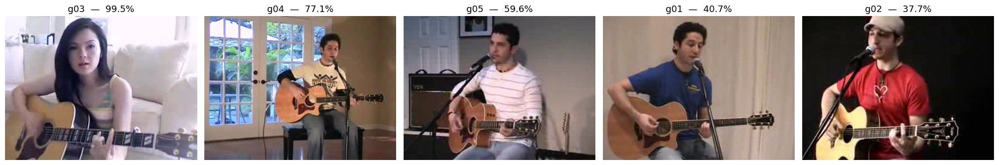

In [38]:
# EXPERIMENTO 2 — duración real + inspección visual
import subprocess, glob, os
import matplotlib.pyplot as plt
from PIL import Image

# (a) ¿los 250 frames son reales?
print(f"{'video':24} {'duración':>9} {'fps':>7} {'nb_frames':>10} {'jpgs':>6}")
for g in range(1, 6):
    v = f'/content/UCF-101/PlayingGuitar/v_PlayingGuitar_g0{g}_c01.avi'
    out = subprocess.run(['ffprobe', '-v', 'error', '-select_streams', 'v:0',
                          '-show_entries', 'stream=duration,r_frame_rate,nb_frames',
                          '-of', 'csv=p=0', v], capture_output=True, text=True).stdout.strip()
    n = len(glob.glob(f'/content/data/exp1/v_PlayingGuitar_g0{g}_c01/img_*.jpg'))
    print(f"v_PlayingGuitar_g0{g}_c01 {out:>28}  {n:6d}")

# (b) frame central de cada clip, en el orden de confianza obtenido
orden = [('g03', 99.49), ('g04', 77.13), ('g05', 59.63), ('g01', 40.66), ('g02', 37.72)]
fig, axes = plt.subplots(1, 5, figsize=(20, 4.5))
for ax, (g, conf) in zip(axes, orden):
    fs = sorted(glob.glob(f'/content/data/exp1/v_PlayingGuitar_{g}_c01/img_*.jpg'))
    ax.imshow(Image.open(fs[len(fs)//2]))
    ax.set_title(f'{g}  —  {conf:.1f}%', fontsize=13)
    ax.axis('off')
plt.tight_layout(); plt.show()


In [39]:
# EXPERIMENTO 3 — ablación del desplazamiento temporal
from ops.temporal_shift import TemporalShift
import numpy as np, torch, os
from torch.nn import functional as F

# añadir HighJump al set de prueba para tener una acción con dinámica fuerte
vid2jpg('v_HighJump_g01_c02.avi',
        '/content/UCF-101/HighJump/v_HighJump_g01_c02.avi', '/content/data/exp1/')

ds = TSNDataSet('/content/data/exp1', num_segments=this_test_segments, new_length=1,
                modality='RGB', image_tmpl='img_{:05d}.jpg', test_mode=True,
                remove_missing=True,
                transform=torchvision.transforms.Compose([
                    cropping, Stack(roll=False), ToTorchFormatTensor(div=True),
                    GroupNormalize(net.input_mean, net.input_std)]),
                dense_sample=False, twice_sample=False)
dl = torch.utils.data.DataLoader(ds, batch_size=1, shuffle=False)

def set_shift(on):
    n = 0
    for m in net.modules():
        if isinstance(m, TemporalShift):
            m.fold_div = 8 if on else 10**9      # fold = C//10^9 = 0  ->  identidad
            n += 1
    return n

def predecir():
    net.eval(); out = {}
    with torch.no_grad():
        for k, data in enumerate(dl):
            di = data.view(-1, 3, data.size(2), data.size(3)).view(1, this_test_segments, 3, 224, 224)
            p = F.softmax(net(di), dim=1).cpu().numpy().reshape(-1)
            out[os.path.basename(ds.video_list[k].path)] = p
    return out

print('módulos TSM afectados:', set_shift(True));  con = predecir()
set_shift(False);                                  sin = predecir()
set_shift(True)                                    # restaurar

GT = {'PlayingGuitar': 232, 'HighJump': 151}       # playing guitar / high jump
print(f"\n{'video':28} {'p(GT) TSM ON':>13} {'p(GT) TSM OFF':>14} {'Δ':>8}   top-1 sin TSM")
print('-' * 88)
for nom in sorted(con):
    gt = GT['HighJump'] if 'HighJump' in nom else GT['PlayingGuitar']
    a, b = con[nom][gt] * 100, sin[nom][gt] * 100
    t1 = int(np.argmax(sin[nom]))
    print(f"{nom:28} {a:12.2f}% {b:13.2f}% {a-b:+7.2f}   {labels[t1]} ({sin[nom][t1]*100:.1f}%)")


video number:6
módulos TSM afectados: 16

video                         p(GT) TSM ON  p(GT) TSM OFF        Δ   top-1 sin TSM
----------------------------------------------------------------------------------------
v_HighJump_g01_c02                  99.12%         16.37%  +82.76   high jump (16.4%)
v_PlayingGuitar_g01_c01             40.66%         10.39%  +30.27   playing clarinet (38.2%)
v_PlayingGuitar_g02_c01             18.92%         24.05%   -5.13   playing clarinet (28.7%)
v_PlayingGuitar_g03_c01             99.49%         99.06%   +0.42   playing guitar (99.1%)
v_PlayingGuitar_g04_c01             77.13%         66.30%  +10.83   playing guitar (66.3%)
v_PlayingGuitar_g05_c01             59.63%         42.90%  +16.72   playing guitar (42.9%)


In [41]:
# EXPERIMENTO 4 — (a) barrido de proporción  (b) offline bidireccional vs online unidireccional
import torch, numpy as np, os
from torch.nn import functional as F
from ops.temporal_shift import TemporalShift

_shift_original = TemporalShift.shift

def shift_unidireccional(x, n_segment, fold_div=3, inplace=False):
    """TSM online: solo el pasado entra al presente (Figura 1c del paper)."""
    nt, c, h, w = x.size()
    n_batch = nt // n_segment
    x = x.view(n_batch, n_segment, c, h, w)
    fold = c // fold_div
    out = torch.zeros_like(x)
    out[:, 1:, :fold] = x[:, :-1, :fold]      # pasado -> presente
    out[:, :, fold:]  = x[:, :, fold:]        # el resto intacto
    return out.view(nt, c, h, w)

def set_div(d):
    for m in net.modules():
        if isinstance(m, TemporalShift):
            m.fold_div = d

GT = {'PlayingGuitar': 232, 'HighJump': 151}

def evaluar():
    net.eval(); r = {}
    with torch.no_grad():
        for k, data in enumerate(dl):
            di = data.view(-1, 3, data.size(2), data.size(3)).view(1, this_test_segments, 3, 224, 224)
            p = F.softmax(net(di), dim=1).cpu().numpy().reshape(-1)
            nom = os.path.basename(ds.video_list[k].path)
            gt = GT['HighJump'] if 'HighJump' in nom else GT['PlayingGuitar']
            r[nom] = p[gt] * 100
    return r

filas = []

# (a) barrido bidireccional (el shift original)
TemporalShift.shift = staticmethod(_shift_original)
for d in [2, 4, 8, 16, 32, 10**9]:
    set_div(d)
    etq = 'identidad (sin shift)' if d >= 10**6 else f'fold_div={d:<3} → {2/d:.3f} desplazado'
    filas.append((f'bidireccional  {etq}', evaluar()))

# (b) unidireccional (online) con 1/8
TemporalShift.shift = staticmethod(shift_unidireccional)
set_div(8)
filas.append(('unidireccional fold_div=8   → 0.125 (solo pasado)', evaluar()))

# restaurar el estado original
TemporalShift.shift = staticmethod(_shift_original)
set_div(8)

vids = sorted(filas[0][1])
cab = " ".join(f"{v.replace('v_','').replace('_c01','').replace('_c02',''):>14}" for v in vids)
print(f"{'configuración':52} {cab}")
print('-' * (52 + 15 * len(vids)))
for etiqueta, r in filas:
    print(f"{etiqueta:52} " + " ".join(f"{r[v]:13.2f}%" for v in vids))


configuración                                          HighJump_g01 PlayingGuitar_g01 PlayingGuitar_g02 PlayingGuitar_g03 PlayingGuitar_g04 PlayingGuitar_g05
----------------------------------------------------------------------------------------------------------------------------------------------
bidireccional  fold_div=2   → 1.000 desplazado                0.52%         11.05%         54.21%         99.19%         51.51%         55.16%
bidireccional  fold_div=4   → 0.500 desplazado                3.53%         48.01%         31.35%         99.86%         91.19%         44.75%
bidireccional  fold_div=8   → 0.250 desplazado               99.12%         40.66%         18.92%         99.49%         77.13%         59.63%
bidireccional  fold_div=16  → 0.125 desplazado               93.19%         33.57%         26.43%         99.66%         85.49%         53.90%
bidireccional  fold_div=32  → 0.062 desplazado               76.11%         22.81%         28.32%         99.51%         81.04%


Basado en el tutorial de la clase, responde las siquientes preguntas

1. ¿El modelo TSM es un modelo 3D o 2D? (1 pto)



**Respuesta:**

**TSM es un modelo 2D.** Su backbone es una ResNet-50 estándar de convoluciones
bidimensionales; no hay una sola convolución 3D en la red, ni una dimensión temporal en
sus tensores. Lo que TSM logra es el **comportamiento** de una CNN 3D manteniendo la
complejidad de una 2D: el propio paper lo describe como convertir cualquier CNN 2D en un
modelo **pseudo-3D** "at zero computation and zero parameters".

Esto es verificable en el código del laboratorio:

1. El backbone se instancia con `torchvision.models.resnet50(...)` en `ops/models.py`
   (`_prepare_base_model`), es decir la misma red de clasificación de imágenes.
2. Los 8 frames no ocupan una dimensión temporal: el transform `Stack` los **concatena
   sobre el eje de canales** (8 × 3 = 24 canales), y antes del forward se hace
   `data.view(-1, 3, H, W)`, convirtiendo el tiempo en dimensión de *batch*. Para la
   ResNet-50 la entrada es un lote de 8 imágenes RGB independientes.
3. El módulo `TemporalShift` **no tiene parámetros entrenables**: son tres operaciones de
   slicing sobre un tensor. Los pesos del modelo son exactamente los de una ResNet-50 más
   el clasificador `new_fc` (2048 → 400).
4. El único punto donde el tiempo existe es dentro de `TemporalShift.shift`, que hace
   `x.view(n_batch, n_segment, c, h, w)` para identificar frames vecinos, desplaza parte
   de los canales y vuelve a aplanar.

**Verificación experimental propia.** Anulando los 16 módulos TSM (haciendo `fold_div`
arbitrariamente grande, de modo que `fold = C // fold_div = 0` y el módulo se vuelve la
identidad) el modelo se reduce a un TSN 2D puro sin tocar un solo peso. La probabilidad
de la clase correcta en `v_HighJump_g01_c02` cae de **99,12 % a 16,37 %**, lo que muestra
que todo el modelado temporal del modelo reside en esas operaciones de desplazamiento y
no en la arquitectura convolucional, que sigue siendo íntegramente 2D.


2. ¿Cómo funciona el Módulo de Desplazamiento Temporal (TSM)? (1 pto)

**Respuesta:**

El TSM **desplaza una parte de los canales del mapa de características a lo largo del eje
temporal**, de modo que cada frame recibe información de sus vecinos sin ningún cómputo
adicional.

**La intuición del paper.** Una convolución 1-D de kernel 3 se puede descomponer en dos
pasos: `Y = w₁·X₋₁ + w₂·X₀ + w₃·X₊₁` equivale a **desplazar** la entrada en −1, 0, +1 y
luego **multiplicar-acumular**. TSM ejecuta el desplazamiento en la dimensión temporal —que
es gratis, solo movimiento de datos— y delega la multiplicación-acumulación en la
convolución 2D que viene inmediatamente después. En palabras de los autores: *"we shift in
the time dimension by ±1 and fold the multiply-accumulate from time dimension to channel
dimension"*.

**La operación exacta** (`ops/temporal_shift.py`), sobre un tensor
`x` de forma `(N, T, C, H, W)` con `fold = C // fold_div` y `fold_div = 8`:

```python
out[:, :-1, :fold]        = x[:, 1:, :fold]          # el futuro (t+1) entra al presente
out[:, 1:, fold:2*fold]   = x[:, :-1, fold:2*fold]   # el pasado (t-1) entra al presente
out[:, :,  2*fold:]       = x[:, :,  2*fold:]        # el resto (3/4) no se mueve


3. ¿Cuál es la diferencia entre el desplazamiento en línea y el desplazamiento fuera de línea? (1 pto)

**Respuesta:**

La diferencia está en **qué frames vecinos puede usar el desplazamiento**, y de ahí se
derivan todas las demás.

**Desplazamiento fuera de línea (offline, bidireccional).** Requiere el clip completo
disponible de antemano. Desplaza 1/8 de los canales hacia el pasado y 1/8 hacia el futuro
(1/4 del total), de modo que cada frame se mezcla con el anterior *y* el siguiente. Es la
configuración del checkpoint usado en este laboratorio (`shift8_blockres`) y la que alcanza
la máxima precisión: es adecuada para reconocimiento por lotes de alto rendimiento, donde
la latencia no importa.

**Desplazamiento en línea (online, unidireccional).** Está pensado para flujos de video en
vivo, donde **los frames futuros todavía no existen**. Solo se desplaza información del
pasado al presente, usando 1/8 de los canales en una única dirección. Su implementación es
un caché: para cada frame se guardan en memoria los primeros 1/8 de los mapas de
características de cada bloque residual; al llegar el frame siguiente, se reemplaza su
primer 1/8 por el cacheado y se combina 7/8 actual + 1/8 antiguo.

Consecuencias prácticas que el paper destaca:

| | offline (bidireccional) | online (unidireccional) |
|---|---|---|
| Frames necesarios | el clip completo | solo el actual + caché |
| Canales desplazados | 1/4 (1/8 por dirección) | 1/8 (solo pasado) |
| Causalidad | no causal | causal |
| Latencia | alta (espera el clip) | baja: una predicción por frame |
| Memoria | activaciones de T frames | 1/8 de features cacheados |
| Precisión | mayor | algo menor |

El paper reporta para el modo online **13 ms de latencia en Jetson Nano y 35 ms en Galaxy
Note8**, lo que habilita reconocimiento en tiempo real en dispositivos de borde.

**Verificación experimental propia.** Se simuló el modo online reemplazando la operación
de desplazamiento por su versión unidireccional (solo pasado → presente) y se comparó con
la bidireccional **a igual cantidad de canales desplazados** (12,5 %), sobre
`v_HighJump_g01_c02`:

| configuración | canales desplazados | p(high jump) |
|---|---|---|
| bidireccional (`fold_div=8`) | 25,0 % | 99,12 % |
| bidireccional (`fold_div=16`) | 12,5 % | 93,19 % |
| **unidireccional (`fold_div=8`)** | **12,5 %** | **92,73 %** |
| sin desplazamiento | 0 % | 16,37 % |

El resultado es informativo: con el mismo presupuesto de canales, la versión unidireccional
rinde prácticamente igual que la bidireccional (92,73 % frente a 93,19 %), pese a que los
pesos fueron entrenados de forma bidireccional. La ventaja del modo offline en este caso no
proviene de **acceder al futuro**, sino de **desplazar el doble de canales**. La medición se
limita a un video con dinámica marcada y a pesos no reentrenados, por lo que no es
concluyente en general, pero sugiere que el costo real del modo online es el menor ancho de
banda temporal más que la pérdida de causalidad.

4. ¿Qué propone el TSN? (1 pto)

**Respuesta:**

**TSN (Temporal Segment Networks**, Wang et al., ECCV 2016) propone un marco de
reconocimiento de acciones **a nivel de video** —no de frame ni de clip corto— basado en
**muestreo temporal esparcido por segmentos** con **consenso a nivel de video**, entrenable
de extremo a extremo.

**El problema que ataca.** Las two-stream ConvNets previas veían un frame (rama espacial) o
un stack corto de flujo óptico (rama temporal): solo modelaban movimiento de **corto
alcance**. Los intentos de cubrir rango largo usaban muestreo denso a tasa fija, con dos
defectos: es computacionalmente caro (obligaba a limitarse a ventanas de 64–120 frames) y
es **redundante**, porque los frames consecutivos son casi idénticos.

**La propuesta.** Dado un video V, se lo divide en K segmentos de igual duración
{S₁,…,S_K} y se muestrea **un snippet corto de cada segmento**:

TSN(T₁,…,T_K) = H( G( F(T₁;W), …, F(T_K;W) ) )

donde F es la ConvNet (con **parámetros W compartidos** entre todos los snippets), G es la
**función de consenso segmental** —promedio uniforme, el que mejor resultó frente a máximo
y promedio ponderado— y H es softmax. Como K es fijo, el costo es constante e independiente
de la duración del video, y el gradiente se calcula sobre el consenso: la red aprende del
**video completo**, no de un fragmento.

**Segundo aporte: buenas prácticas** para entrenar redes profundas con datasets pequeños:
pre-entrenamiento cruzado de modalidades (inicializar la rama de flujo con pesos RGB),
*partial BN* con dropout (congelar media y varianza de todas las capas BN salvo la primera)
y aumento de datos con recorte de esquinas y *scale jittering*. Con todo ello alcanza
**UCF101 = 94,2 %** y **HMDB51 = 69,4 %**.

**Relación con este laboratorio.** TSM se construye literalmente sobre TSN: en el código, la
clase que instancia el modelo **se llama `TSN`**, y TSM no es más que ese mismo marco con
`is_shift=True`. Todo lo que usamos aquí —los 8 segmentos, el muestreo por segmentos, el
consenso por promedio (`crop_fusion_type='avg'`), el dropout de 0,8— es infraestructura de
TSN.

**Su limitación, que es exactamente lo que TSM viene a resolver.** El consenso por promedio
es **invariante al orden**: promediar las predicciones de los 8 snippets da el mismo
resultado si el video se reproduce al revés. TSN puede reconocer *qué* aparece a lo largo
del video, pero no puede inferir el **orden** de los eventos. TSM inserta el desplazamiento
temporal en las capas intermedias para que los features —no solo las predicciones finales—
estén contaminados por sus vecinos temporales. El efecto se ve en la tabla 1 del paper de
TSM: TSN 70,6 % → TSM 74,1 % en Kinetics, pero TSN 20,5 % → TSM 47,3 % en
Something-Something V1, un dataset donde el orden es indispensable.


5. ¿Cuáles son las diferencias entre el muestreo por segmentos y el muestreo uniforme? (1 pto)

**Respuesta:**

**Muestreo uniforme (a tasa fija, o denso).** Se toman frames a un intervalo predefinido:
todos los frames, o uno cada N, o una ventana contigua de longitud fija (I3D usa 64 frames
consecutivos). Sus propiedades:

- El número de frames **depende de la duración** del video, por lo que el costo crece con
  ella. En la práctica obliga a acotar la ventana a 64–120 frames.
- Para videos más largos que la ventana, **solo se cubre una fracción** del video y se puede
  perder el evento relevante.
- Genera **alta redundancia**: los frames consecutivos son casi idénticos.
- A cambio, preserva la **granularidad fina del movimiento**: al estar los frames separados
  por ~40 ms se puede modelar movimiento local (es lo que hace posible el flujo óptico).

**Muestreo por segmentos (esparcido, TSN).** El video se divide en K segmentos de igual
duración y se toma **un frame de cada uno**:

- El número de frames es **fijo (K = 8 en este laboratorio)** sea el video de 3 o de 30
  segundos: el costo es constante y predecible.
- La **cobertura es siempre el video completo**; lo que se estira o encoge es el paso entre
  frames.
- Elimina la redundancia de raíz en vez de procesarla y descartarla.
- **En entrenamiento la posición dentro de cada segmento es aleatoria** (`_sample_indices`),
  lo que funciona como aumentación temporal: cada época el modelo ve una combinación
  distinta de frames del mismo video. **En test es determinista**: el frame del centro de
  cada segmento (`_get_test_indices`, `int(tick/2 + tick·x)`).
- Su costo es la pérdida de **movimiento fino**: entre dos frames separados por más de un
  segundo no hay continuidad de movimiento que modelar.

En el código del laboratorio ambas estrategias conviven: `_get_test_indices` implementa el
muestreo por segmentos, y la rama `dense_sample` implementa el muestreo denso estilo I3D
(10 clips de 64 frames contiguos). El argumento `dense_sample` está en `False`, por lo que
se usa el muestreo por segmentos.

**Observación empírica propia.** Los videos de `PlayingGuitar` tienen 250 frames
(10,0 s a 25 fps), de modo que el muestreo por segmentos toma **un frame cada 31 frames
(≈ 1,25 s)**. A esa escala, tocar la guitarra es una acción cuasi-estática: los 8 frames son
casi la misma imagen y el desplazamiento temporal encuentra poco que mezclar. Medimos que en
`v_PlayingGuitar_g03_c01` la predicción es **insensible a toda manipulación temporal**
(rango de solo 0,8 puntos entre desplazar el 100 % de los canales y no desplazar ninguno),
mientras que en `v_HighJump_g01_c02` —donde los 8 frames cubren carrera, despegue, vuelo y
caída— el rango es de **98,6 puntos**. Esto ilustra el compromiso central: el muestreo por
segmentos captura muy bien la **estructura de largo alcance** y sacrifica el **movimiento
de corto alcance**, lo que lo hace ideal para acciones definidas por una progresión de
etapas y poco informativo para acciones definidas por gestos rápidos y repetitivos.

Cabe notar una inconsistencia del tutorial: el checkpoint utilizado
(`..._e100_dense.pth`) fue entrenado con **muestreo denso**, pero se evalúa con
`dense_sample=False`, es decir con muestreo por segmentos. Las políticas de muestreo de
entrenamiento y evaluación no coinciden.
